In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import folium
import geopandas as gpd

In [2]:
res_data = pd.read_csv('Dataset .csv')

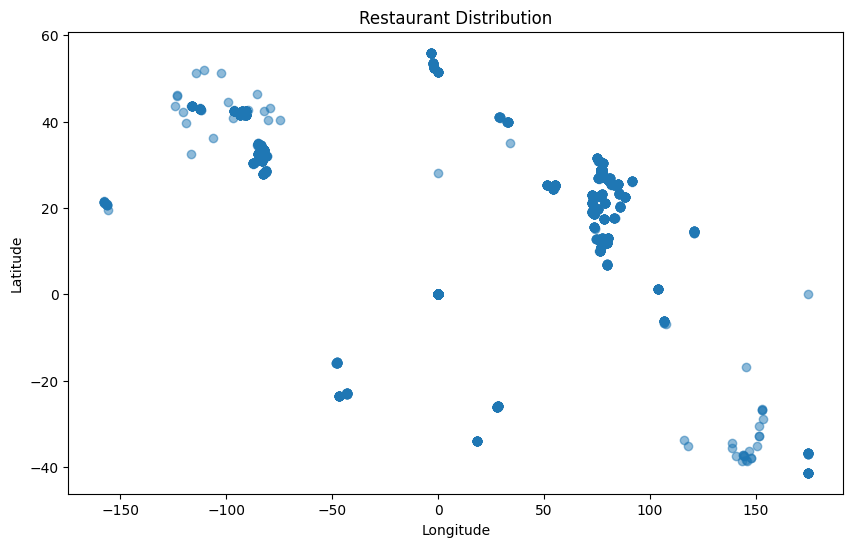

In [3]:
# Distribution of restaurants on the map (longitude and latitude)
# Display scatter plot of restaurants in the co-ordinates

if "Latitude" and "Longitude" in res_data.columns:
  plt.figure(figsize=(10, 6))
  plt.scatter(res_data["Longitude"], res_data["Latitude"], alpha=0.5)
  plt.xlabel("Longitude")
  plt.ylabel("Latitude")
  plt.title("Restaurant Distribution")
  plt.show()
else:
  print("Latitude and longitude columns not found.")

In [8]:
# Load the restaurant dataset into a GeoDataFrame
restaurants_gdf = gpd.GeoDataFrame(res_data, geometry=gpd.points_from_xy(res_data['Longitude'], res_data['Latitude']))

# create a map centered around the mean latitude and longitude of the restaurant locations
map_restaurants = folium.Map(location=[restaurants_gdf['geometry'].y.mean(), restaurants_gdf['geometry'].x.mean()], zoom_start = 3)
restaurants_gdf.crs = 'EPSG:4326'
folium.GeoJson(restaurants_gdf).add_to(map_restaurants)

#map_restaurants.save('restaurants_map.html')
map_restaurants